# Домашнее задание 3

1) [1 балл] Реализуйте чтение изображений, лежащих в /data/imgs/arrow (как в демо с калибровкой камеры с семинара). Вся обязательная часть задания выполняется с этими изображениями

1) [2 балла] Реализуйте нахождение расстояния от камеры до листка, учитывая, что это тот же листок, что был в первом демо

2) [3 балла] Реализуйте приведение изображения листка к "виду сверху"

3) [6 баллов] Реализуйте определение направления, в котором указывает стрелка. Можно использовать скелетонизацию из первого семинара по зрению: получить маску темной области (стрелки) внутри изображения листка, применить скелетонизацию, вычислить направление. Можно поступить иначе: после нахождения маски вычислить градиенты Собеля по x и y и проанализировать их направления. P.S. Можно использовать и полностью свой метод

4) [3 балла] Доп. задача 1: Примените написанный Вами код к видео https://drive.google.com/file/d/1AQhg2lL5FL4edlOcxY2SHOOZ-v9TgHBD/view?usp=sharing. Загрузите видео на свой гугл диск, а затем дополните имеющийся код монтированием диска и чтением в цикле кадров видео, приведёнными в конце семинара

5) [5 баллов] Доп. задача 2: определите, нормально ли видно листок в кадре. На некоторых кадрах его видно не полностью, один или больше уголков находятся за кадром. Это можно автоматически обнаруживать, к примеру используя размеры стрелки, и выводить на соответствующем кадре маркер - текст или цветную метку

## Setup

In [1]:
!rm -rf cvr_course
!git clone https://github.com/tndrd/cvr_course -b main

Cloning into 'cvr_course'...
remote: Enumerating objects: 541, done.
remote: Counting objects: 100% (50/50), done.
remote: Compressing objects: 100% (45/45), done.
remote: Total 541 (delta 21), reused 27 (delta 5), pack-reused 491
Receiving objects: 100% (541/541), 123.59 MiB | 22.96 MiB/s, done.
Resolving deltas: 100% (128/128), done.


In [2]:
cd cvr_course

/content/cvr_course


In [3]:
!git checkout hw3

Branch 'hw3' set up to track remote branch 'hw3' from 'origin'.
Switched to a new branch 'hw3'


In [4]:
cd notebooks

/content/cvr_course/notebooks


In [5]:
import numpy as np
import cv2
import time
import os
import math
import sys
import glob
from copy import *
from matplotlib import pyplot as plt
from random import randint
plt.rcParams["figure.figsize"] = (10,10)

## Frequently used functions

In [6]:
low_th  = (180, 180, 180)
high_th = (255, 255, 255)

In [7]:
def show(img):
    plt.imshow(img)
    plt.axis('off')
    plt.show()

In [8]:
def thresholding(img):
    blurred = cv2.GaussianBlur(img, (5,5), cv2.BORDER_DEFAULT)
    mask = cv2.inRange (blurred, low_th, high_th)
    return mask

In [9]:
def approximateContour(contour, epsilon):
    approx  = cv2.convexHull(contour)
    epsilon = epsilon * cv2.arcLength (approx, True)
    approx  = cv2.approxPolyDP (approx, epsilon, True)
    return approx

In [10]:
def findPaperBorder(contours, epsilon=0.05):
    
    assert len(contours) > 0
    
    approx = approximateContour(contours[0], epsilon)
    return approx

In [11]:
def drawText(image, text, point, size, color=(255, 0, 0)):
    font = cv2.FONT_HERSHEY_SIMPLEX
    fontScale = 1
    cv2.putText(image, text, tuple(point), font, fontScale, color, size, cv2.LINE_AA)

In [12]:
def debugShowAllContours(image, contours):
    canvas = image.copy()
    cv2.drawContours(canvas, contours, -1, (255,0,0), 2)
    show(canvas)

In [13]:
def defaultFindContours(mask):
    contours, _ = cv2.findContours(mask, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    return contours

In [14]:
def underline(): print("-------------------------------------------------------------------")

## Task #1

In [15]:
fnames = glob.glob("../data/imgs/arrow/*.png")

images = []

for fname in fnames:
    img = cv2.imread(fname)
    images.append(img)

## Task #2

Код с семинара не работал на всех картинках. Добавил размытие и немного понизил нижний порог цвета. Заработало.
Понятно, что для изображений с обрезанными углами значения будут неточными.
Не очень понятна формула для нахождения расстояния (см. ниже).

In [16]:
def findPaperDistance (paper_corners):
    length = cv2.arcLength (paper_corners, True)
    
    # Предположу, что тут имеется в виду distance = focal_dist * real_perimeter / rect_on_image_perimeter   
    distance = 180.0 * 364 / length
    return distance

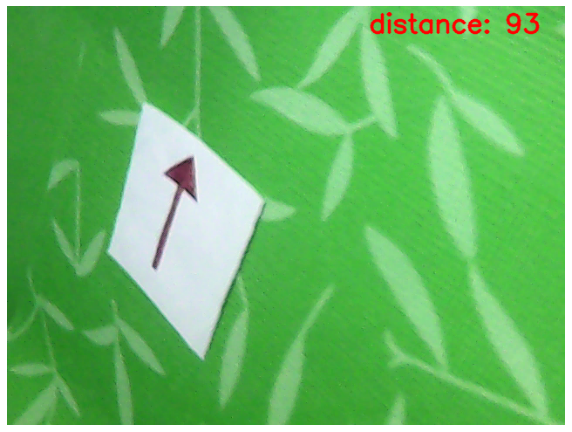

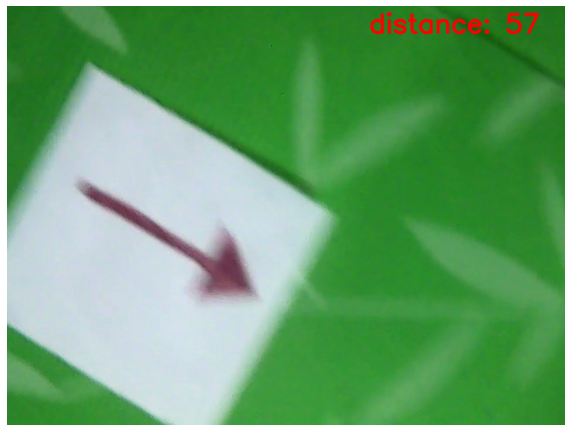

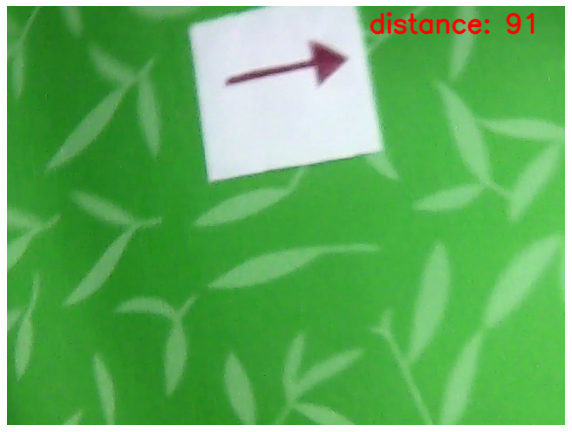

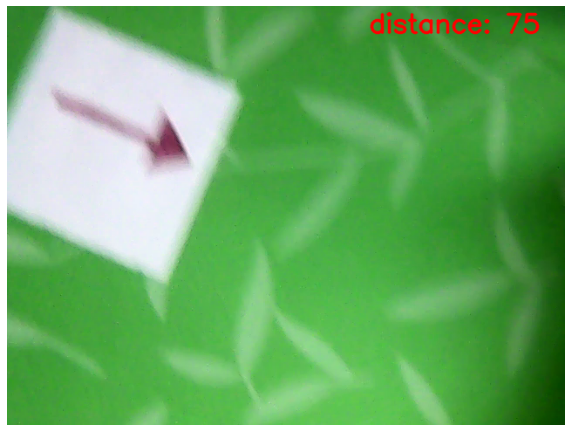

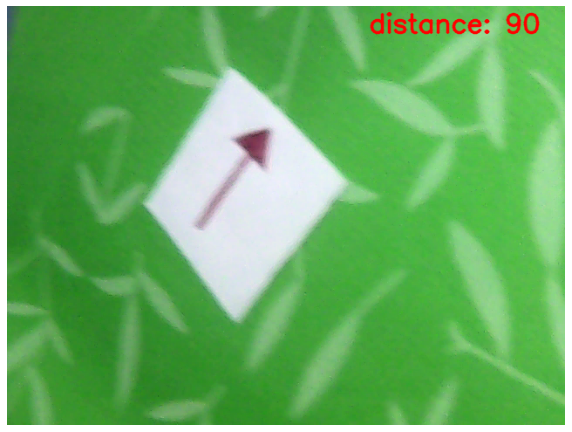

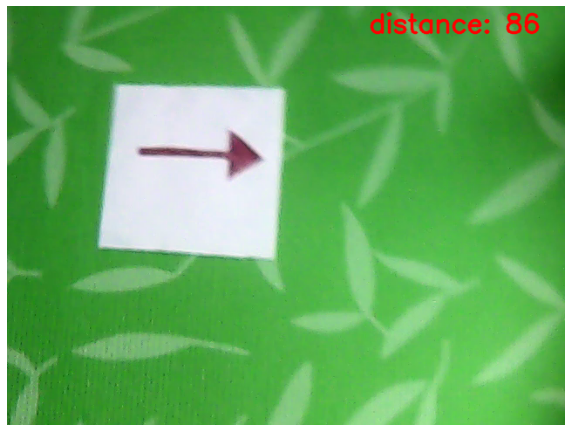

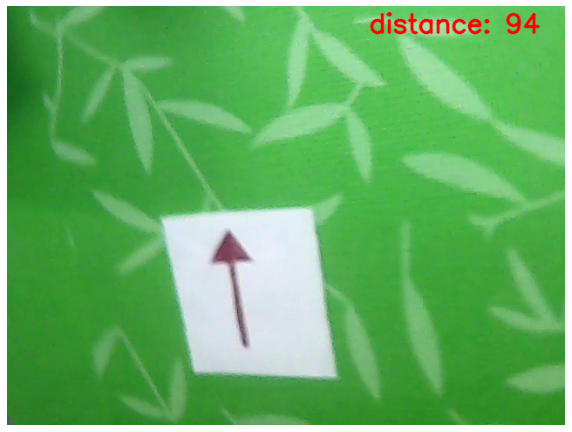

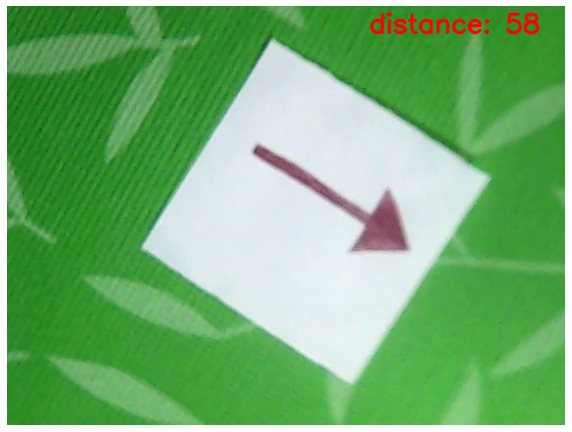

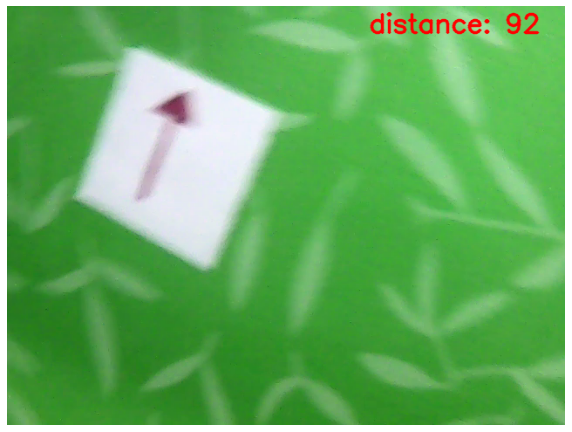

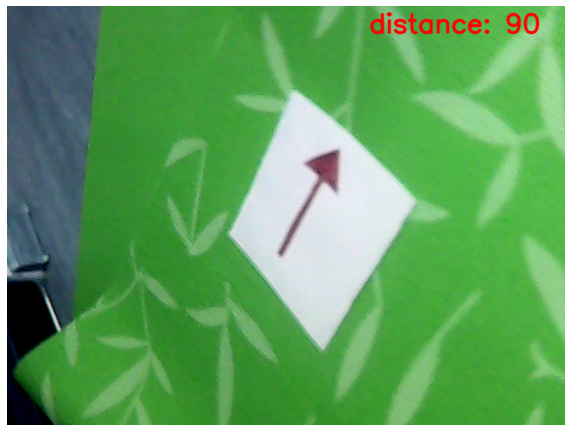

In [17]:
for image in images:
    canvas = image.copy()

    mask     = thresholding(canvas)
    contours = defaultFindContours(mask)
    corners = findPaperBorder(contours)

    drawText(canvas, "distance: " + str(int(findPaperDistance(corners))), (415, 30), 2)
    show(canvas)

## Task #3

Код с семинара работал не для всех картинок, проблема была в orderPoints. Пояснения в комментариях.

In [18]:
def orderPoints(pts):
    # rect = [tl, tr, br, bl]

    rect = np.zeros((4, 2), dtype="float32")
    
    # Проблема: если граница почти параллельна прямой x=y, то bl может стать равным br, а tr - равным tl.
    
    s = pts.sum(axis=1)
    diff = np.diff(pts, axis=1) 
    
    rect[0] = pts[np.argmin(s)]
    rect[2] = pts[np.argmax(s)]
    
    rect[1] = pts[np.argmin(diff)]
    rect[3] = pts[np.argmax(diff)]
    
    return rect

In [19]:
def newOrderPoints(hull):
    
    # Если почитать документацию cv2.convexHull, то можно узнать, что полученные ею точки расположены против часовой стрелки. Это я и ипользую.

    assert len(hull == 4)

    i_min = 0
    for i in range(len(hull)):
        if hull[i][0]**2 + hull[i][1]**2 < hull[i_min][0]**2 + hull[i_min][1]**2:
            i_min = i
        
        
    tl = hull[i_min]
    tr = hull[(i_min + 1) % 4]
    br = hull[(i_min + 2) % 4]
    bl = hull[(i_min + 3) % 4]
        
    # rect = [tl, tr, br, bl]
    rect = np.zeros((4, 2), dtype="float32")
    
    rect[0] = tl
    rect[1] = tr
    rect[2] = br
    rect[3] = bl
    
    return rect

In [20]:
def fourPointTransform(image, pts, canvas=None):
    
    if len(pts) != 4: return None

    rect = newOrderPoints(pts)
    (tl, tr, br, bl) = rect
    
    widthA = np.sqrt(((br[0] - bl[0]) ** 2) + ((br[1] - bl[1]) ** 2))
    widthB = np.sqrt(((tr[0] - tl[0]) ** 2) + ((tr[1] - tl[1]) ** 2))
    maxWidth = max(int(widthA), int(widthB))
    
    heightA = np.sqrt(((tr[0] - br[0]) ** 2) + ((tr[1] - br[1]) ** 2))
    heightB = np.sqrt(((tl[0] - bl[0]) ** 2) + ((tl[1] - bl[1]) ** 2))
    maxHeight = max(int(heightA), int(heightB))
    
    dst = np.array([
        [0, 0],
        [maxWidth - 1, 0],
        [maxWidth - 1, maxHeight - 1],
        [0, maxHeight - 1]], dtype="float32")
    
    M = cv2.getPerspectiveTransform(rect, dst)
    warped = cv2.warpPerspective(image, M, (maxWidth, maxHeight))
    
    if canvas is not None:
        drawText(canvas, "tl", tuple(map(int, tl)), 2)
        drawText(canvas, "tr", tuple(map(int, tr)), 2)
        drawText(canvas, "br", tuple(map(int, br)), 2)
        drawText(canvas, "bl", tuple(map(int, bl)), 2)

    return warped

In [21]:
def drawWarped(canvas, warped):
    w, h, _ = warped.shape
    canvas[0:(w//2), 0:(h//2)] = warped[:-1:2, :-1:2] 

In [22]:
def warp(image, corners, canvas=None):
    return fourPointTransform (image, np.asarray (corners) [:, 0, :], canvas)

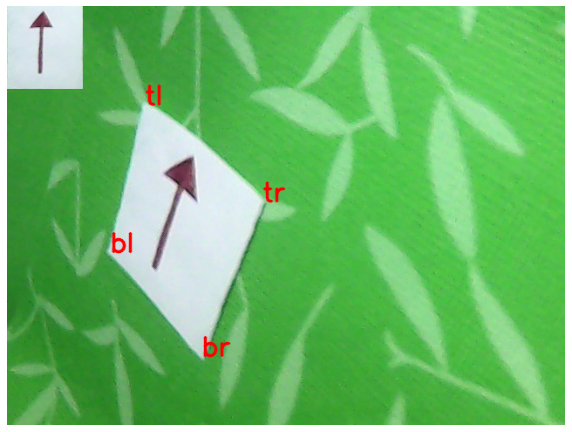

-------------------------------------------------------------------


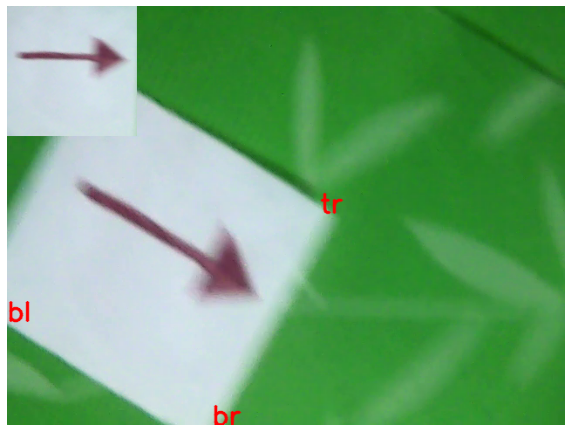

-------------------------------------------------------------------


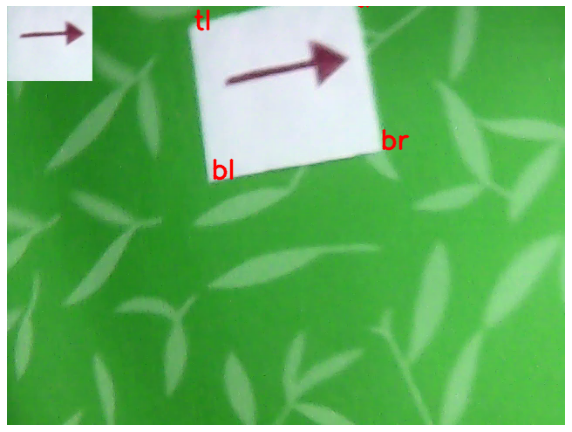

-------------------------------------------------------------------


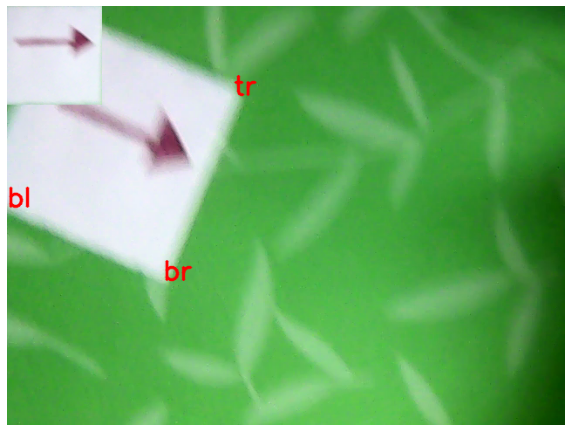

-------------------------------------------------------------------


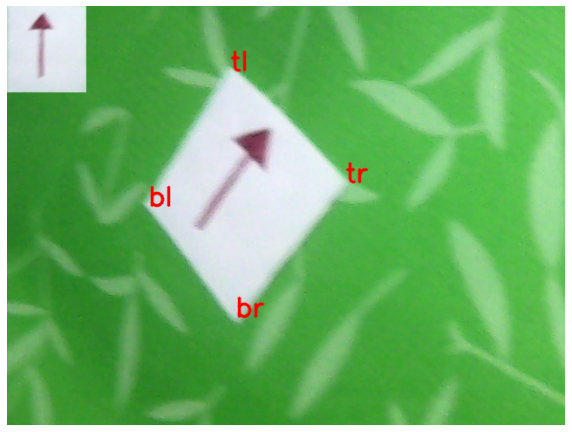

-------------------------------------------------------------------


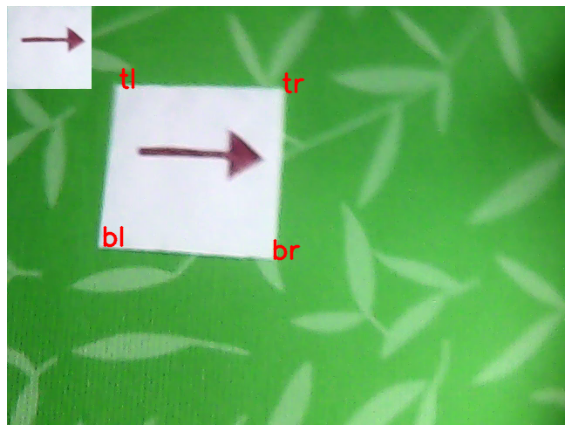

-------------------------------------------------------------------


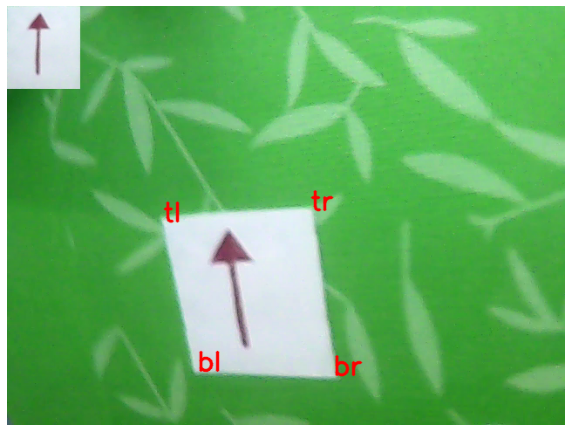

-------------------------------------------------------------------


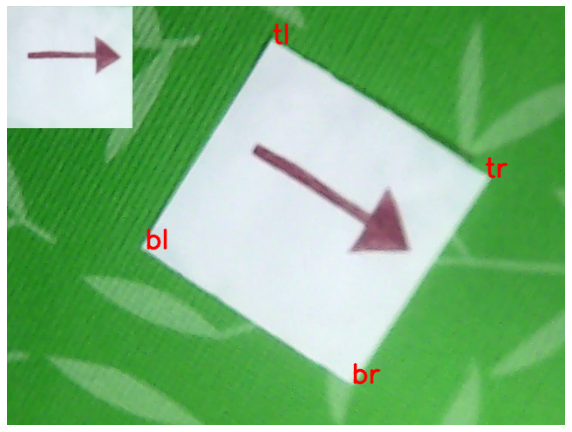

-------------------------------------------------------------------


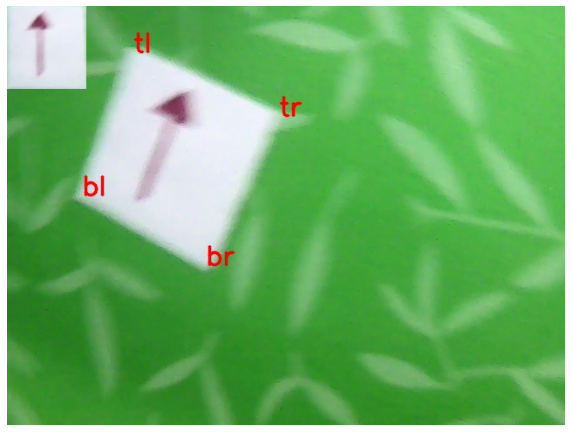

-------------------------------------------------------------------


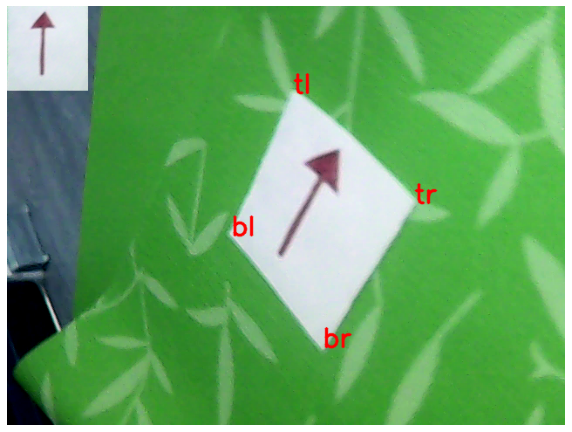

-------------------------------------------------------------------


In [23]:
for image in images:
    
    canvas = image.copy()

    mask    = thresholding(canvas)
    corners = defaultFindContours(mask)

    corners = findPaperBorder(corners)
    warped  = warp(canvas, corners, canvas)
    
    if warped is not None:
        drawWarped(canvas, warped)
        show(canvas)
    else:
        print("Can't warp: can't properly define corners")

    underline()

## Task #4

Сначала я пытался работать со скелетонизацией и морфологическими преобразованиями, неудачно. Сработал обычный подход через фильтрацией в BGR и findCorners. К сожалению, смазанные изображения распознаются плохо. Я попробовал использовать фильтрацию в hsv, adaptiveThreshold, морфологические преобразования в разных комбинациях. Смазанные стрелки все равно не удалось распознать. Начал задумываться о схожести этих фото с капчей "Отметьте все фото, на которых есть стрелки". Пояснения к коду в комментариях.

>Несколько ячеек ниже не используются, просто сохраню 

In [24]:
def post_hsv(hsv):
    morph = cv2.erode(hsv, (5,5),    iterations = 2) 
    morph = cv2.dilate(morph, (5,5), iterations = 2)
    #morph = hsv
    return morph

def pre_hsv(bgr):
    return cv2.GaussianBlur(img, (3,3), cv2.BORDER_DEFAULT)

In [25]:
def choose_image_mask(source):
    img = source
    img = pre_hsv(img)
    
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV) 

    cv2.namedWindow('HSV')

    def nothing(x): pass
    
    hsv_min = ()
    hsv_max = ()

    cv2.createTrackbar('h_min','HSV',0,255,nothing)
    cv2.createTrackbar('s_min','HSV',0,255,nothing)
    cv2.createTrackbar('v_min','HSV',0,255,nothing)
    cv2.createTrackbar('h_max','HSV',0,255,nothing)
    cv2.createTrackbar('s_max','HSV',0,255,nothing)
    cv2.createTrackbar('v_max','HSV',0,255,nothing)

    while(1):
        h_min = cv2.getTrackbarPos('h_min','HSV')
        s_min = cv2.getTrackbarPos('s_min','HSV')
        v_min = cv2.getTrackbarPos('v_min','HSV')
        h_max = cv2.getTrackbarPos('h_max','HSV')
        s_max = cv2.getTrackbarPos('s_max','HSV')
        v_max = cv2.getTrackbarPos('v_max','HSV')

        hsv_min = (h_min, s_min, v_min)
        hsv_max = (h_max, s_max, v_max)

        mask = cv2.inRange(hsv, hsv_min, hsv_max)
        mask = post_hsv(mask)
        
        cv2.imshow('Original',source)
        cv2.imshow('Masked',mask)  
        
        if cv2.waitKey(1)==ord('q'):
            cv2.destroyAllWindows()
            return (hsv_min, hsv_max)


def calculate_average_mask(sources):
    
    sum_h_max = 0
    sum_v_max = 0
    sum_s_max = 0
    
    sum_h_min = 0
    sum_v_min = 0
    sum_s_min = 0
    
    n = 0
    for source in sources:
        
        hsv = choose_image_mask(source)
        
        hsv_min, hsv_max = hsv
        
        sum_h_min += hsv_min[0]
        sum_s_min += hsv_min[1]
        sum_v_min += hsv_min[2]
        
        sum_h_max += hsv_max[0]
        sum_s_max += hsv_max[1]
        sum_v_max += hsv_max[2]
        
        n+=1
    
    hsv_min = (sum_h_min / n, sum_s_min / n, sum_v_min / n)
    hsv_max = (sum_h_max / n, sum_s_max / n, sum_v_max / n)
    
    print("Average thr: "+ str(hsv_min) + " | " + str(hsv_max))
    return (hsv_min, hsv_max)

In [26]:
#hsv_min, hsv_max = calculate_average_mask(images)
#print(hsv_min, hsv_max)

In [27]:
def pre_bgr(bgr):
    return cv2.GaussianBlur(img, (5,5), cv2.BORDER_DEFAULT)

def post_bgr(bgr):
    return bgr

In [28]:
def choose_bgr_threshold(bgr_best, bgr_worst):
     
    pre_bgr_best  = pre_bgr(bgr_best)
    pre_bgr_worst = pre_bgr(bgr_worst)
    
    cv2.namedWindow('Threshold')
    
    def nothing(x): pass

    cv2.createTrackbar('high','Threshold',0,255,nothing)
    cv2.createTrackbar('low','Threshold',0,255,nothing)

    while(1):
        
        high = cv2.getTrackbarPos('high','Threshold')
        low  = cv2.getTrackbarPos('low','Threshold')
        
        high = (high, high, high)
        low  = (low, low, low)
        
        mask_b = cv2.inRange(pre_bgr_best, low, high)
        mask_b = post_bgr(mask_b)
        
        mask_w = cv2.inRange(pre_bgr_worst, low, high)
        mask_w = post_bgr(mask_w)
        
        cv2.imshow('Best source', bgr_best)
        cv2.imshow('Worst source', bgr_worst)
        
        cv2.imshow('Best mask', mask_b)
        cv2.imshow('Worst mask', mask_w)
        
        if cv2.waitKey(1)==ord('q'):
            cv2.destroyAllWindows()
            return (low, high)

In [29]:
#best  = images[2]
#worst = images[8]

#low_th, high_th = choose_bgr_threshold(best, worst)
#print(low_th, high_th)

#low_th, high_th = (201, 201, 201), (255, 255, 255)

>Код ниже используется. Пояснения в комментариях.

In [30]:
def findArrowEnds(contours, epsilon=0.1):
    
    assert len(contours) > 1

    approx = approximateContour(contours [1], epsilon)
    if len(approx) != 2: return None

    return approx

In [31]:
def getRect(pt, R):
        tl = tuple(pt - (R,R))
        br = tuple(pt + (R,R)) 
        return tl, br

In [32]:
def countPoints(mask, rect):
        
        field = mask[rect[0][1]:rect[1][1], rect[0][0]:rect[1][0]]
        #show(field)
        
        return cv2.countNonZero(field)

In [33]:
def findArrow(mask, contours, canvas=None):

    # Поиск концов стрелки (что из них есть хвост или кончик - неизвестно)
    approx = findArrowEnds(contours)    
    if approx is None: return None

    pt1 = approx[0][0]
    pt2 = approx[1][0]
            
    # {Определение ориентации стрелки}
    
    length = cv2.arcLength(approx, False)
    R = int(0.1 * length)
    
    # Определим квадраты c ребром 2R с центром на концах стрелки
    rect_pt1 = getRect(pt1, R)
    rect_pt2 = getRect(pt2, R)

    # Посчитаем точки внутри каждого квадрата
    count1 = countPoints(mask, rect_pt1)
    count2 = countPoints(mask, rect_pt2)
    
    # from, where
    arrow = (0,0)
    
    # Точка, вокруг которой содержится наименьшее количество точек, находится на кончике стрелки
    if count1 < count2:
        arrow = pt2, pt1
    else:
        arrow = pt1, pt2
    
    # Красивая отрисовка процесса
    if canvas is not None:
        drawText(canvas, "1", pt1, 2)
        drawText(canvas, "2", pt2, 2)
        drawText(canvas, "count 1: "+str(count1), (10, 35), 3, (0,0,255))
        drawText(canvas, "count 2: "+str(count2), (10 + 300, 35), 3, (0, 0, 255))
    
    # Готово, у нас есть две упорядоченные точки: хвост и кончик
    return arrow

In [34]:
def drawArrow(canvas, arrow, color, thickness):
    cv2.arrowedLine(canvas, tuple(arrow[0]), tuple(arrow[1]), color, thickness, cv2.LINE_AA, 0, 0.3)

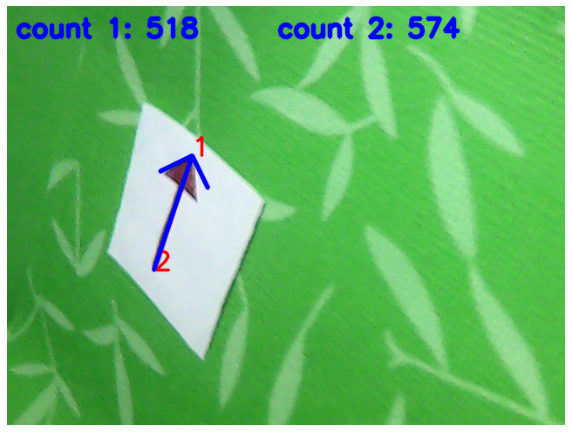

-------------------------------------------------------------------


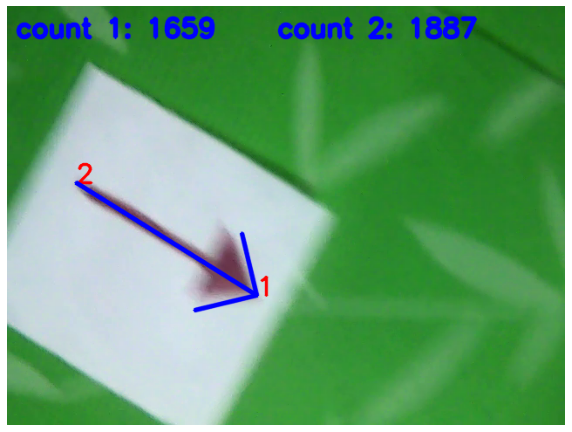

-------------------------------------------------------------------


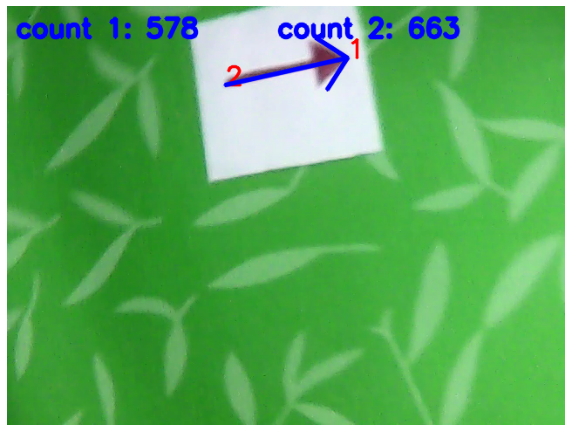

-------------------------------------------------------------------


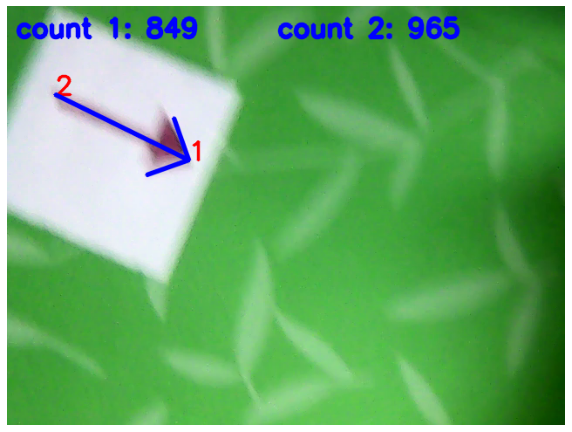

-------------------------------------------------------------------


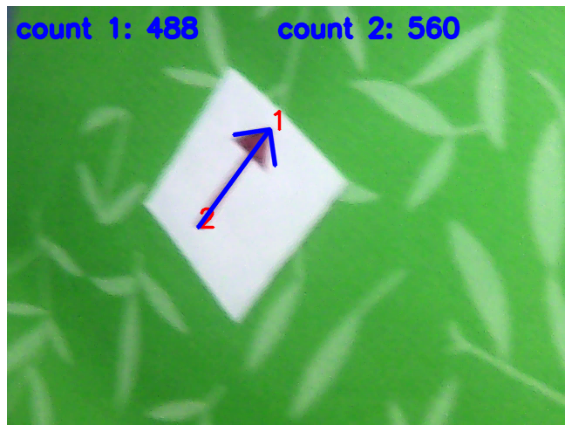

-------------------------------------------------------------------


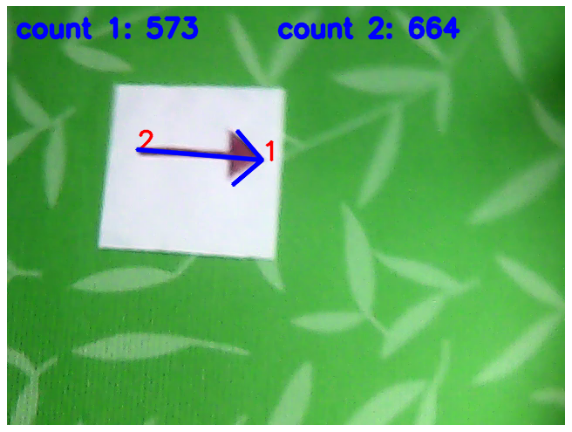

-------------------------------------------------------------------


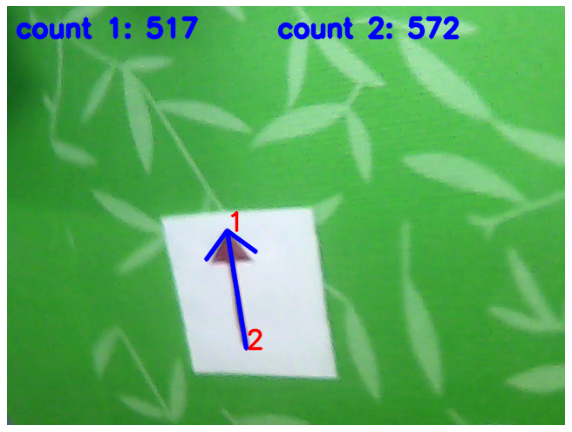

-------------------------------------------------------------------


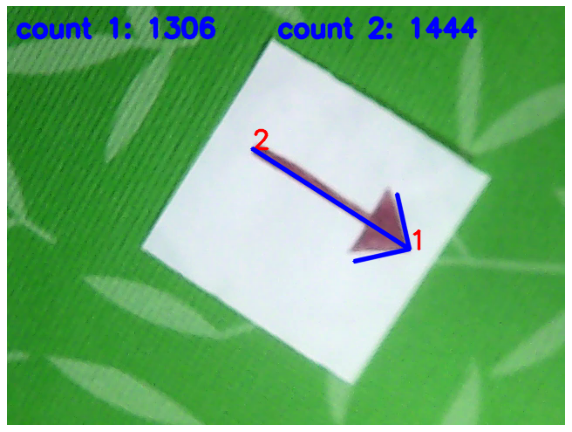

-------------------------------------------------------------------
Cant find arrow


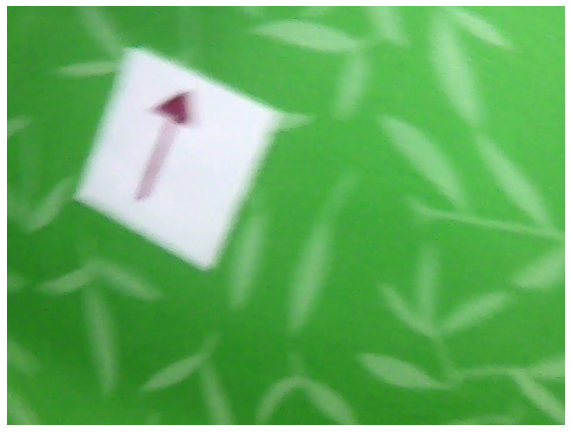

-------------------------------------------------------------------


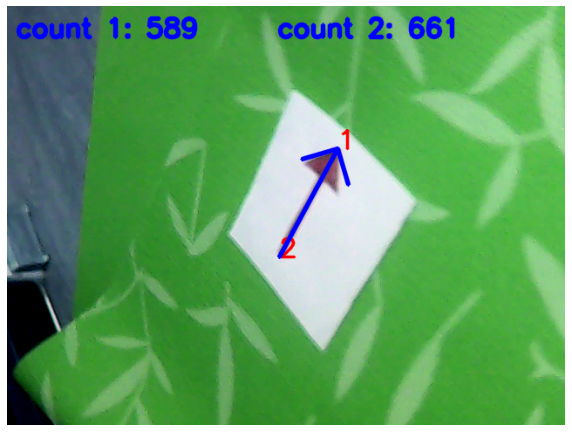

-------------------------------------------------------------------


In [35]:
for image in images:
    canvas = image.copy()

    mask    = thresholding(canvas)
    contours = defaultFindContours(mask)

    arrow = findArrow(mask, contours, canvas)
    
    if arrow:
        drawArrow(canvas, arrow, (0,0,255), 3)
    else:
        print("Cant find arrow")
    
    show(canvas)
    underline()

## Тask 5
Тут все понятно: открываем видео, применяем ранее написанный код, рисуем, записываем новое видео

In [36]:
from google.colab import drive
drive.mount('/content/drive/', force_remount=False)

Mounted at /content/drive/


In [37]:
cd /content/drive/MyDrive

/content/drive/MyDrive


In [38]:
!pwd

/content/drive/MyDrive


In [39]:
def findEverything(frame):

    mask     = thresholding(frame)
    contours = defaultFindContours(mask)
    corners  = findPaperBorder(contours)

    arrow    = findArrow(mask, contours)
    distance = findPaperDistance(corners)

    warped = warp(frame, corners)

    return arrow, distance, warped

In [40]:
def drawEverything(frame, arrow, distance, warped):
    drawArrow(frame, arrow, (0,0,255), 3)
    drawText(frame, "distance: " + str(int(distance)), (410, 30), 2)
    drawWarped(frame, warped)

In [41]:
def videoLoop(cap, out):
    arrow = ((-1,-1), (-2, -2))
    distance = 0
    warped = np.zeros((3,3,3), np.int8)
    while(cap.isOpened()):

        ret, frame = cap.read()

        if not ret: break

        new_arrow, distance, new_warped = findEverything(frame)

        if new_arrow  is not None: arrow  = new_arrow
        if new_warped is not None: warped = new_warped

        drawEverything(frame, arrow, distance, warped)
        out.write(frame)

In [42]:
# Reading video and writing the result
# !OUTPUT ONLY IN .avi FORMAT!
def FindArrowOnVideo(src_fname, dst_fname, out_fps):
    cap = cv2.VideoCapture(src_fname)

    first_frame = None
    fourcc = None
    out = None 

    if not cap.isOpened():
        print("Can't open the video")
        return

    _, first_frame = cap.read()

    fshape  = first_frame.shape
    fheight = fshape[0]
    fwidth  = fshape[1]

    fourcc = cv2.VideoWriter_fourcc(*'XVID')
    out    = cv2.VideoWriter(dst_fname, fourcc, out_fps, (fwidth,fheight))

    videoLoop(cap, out)

    cap.release()
    out.release()

In [43]:
FindArrowOnVideo('3.mov', 'output.avi', 30)

## Task 6

Чтобы проверить, обрезана ли бумажка, достаточно просто посчитать количество углов бумажки на картинке. Если их не 4, то картинка не обрезана. Но есть исключение, когда за границу кадра уходит как минимум одна целая сторона. В таком случае у белого прямоугольника на картинке будет 4 угла. В таком случае нужно как-то по другому определять, обрезана ли картинка.

Это можно сделать, исходя из ее геометрии: центр стрелы (с некоторым сдвигом) должен находиться в центре бумажки.

Центр стрелы простым образом находится из радиус-веторов стрелы. Центр квадрата в любой проекции на плоскость экрана будет находиться в пересечении медиан его углов (конечно же, некоторой погрешностью). Дальнейшие пояснения в комментариях.

In [50]:
# Построение уравнения прямой по двум точкам
def getLine(pt1, pt2):
    x1, y1 = pt1
    x2, y2 = pt2

    A = y1 - y2
    B = x2 - x1
    C = x1*y2 - x2*y1

    return A, B, C

In [51]:
# Расчет точки пересечения двух линий
def intersectLines(line1, line2):
    
    #lines shouldn't be parallel
    
    a1, b1, c1 = line1
    a2, b2, c2 = line2

    A = np.array([[a1, b1],
                  [a2, b2]])
    
    B = np.array([-c1, -c2])

    x_inter, y_inter = np.linalg.solve(A,B)

    return x_inter, y_inter

In [62]:
# Расчет точки пересечения медиан четырехугольника
def getMedianIntersection(corners):

    assert len(corners) == 4

    median1 = getLine(corners[0][0], corners[2][0]) # convexHull возвращает точки
    median2 = getLine(corners[1][0], corners[3][0]) # в порядке против часовой стрелки

    med_inter = intersectLines(median1, median2)

    return med_inter

In [85]:
# Проверка смещения центра бумажки относительно центра стрелы
def checkArrowPosition(arrow, corners):

    # Определение центра стрелы с некоторым сдвигом
    ARROW_CENTER_BIAS = 0.4
    arrow_center = arrow[0] + tuple(map(int, (arrow[1] - arrow[0]) * ARROW_CENTER_BIAS))

    # Пересечение медиан
    med_inter = getMedianIntersection(corners)

    # Сравнение с пороговым значением отношения смещения центров к длине стрелки
    distance    = sum((arrow_center - med_inter)**2)
    arrowlength = sum((arrow[0] - arrow[1])**2)

    DISTANCE_THRESHOLD = 0.03

    if distance / arrowlength < DISTANCE_THRESHOLD:
        return True
    else:
        return False

In [75]:
# Обрезана ли бумажка?
def checkCornersCut(corners, arrow):
    
    if len(corners) != 4:
        return True
    elif arrow is not None:
        return not checkArrowPosition(arrow, corners)
    
    # Возможна ситуация, когда бумажка в кадре имеет 4 угла, но стрелку невозможно найти
    # Ситуация неоднозначная, выделена отдельно (полый маркер)
    else:
        return None

In [73]:
def drawMarker(canvas, thickness):
    cv2.circle(canvas, (30,30), 20, (255, 0,0), thickness)

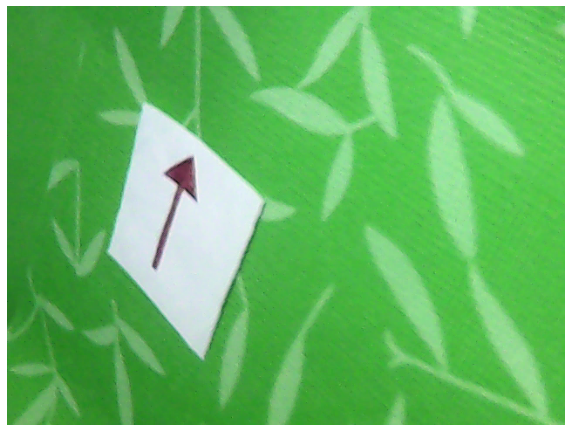

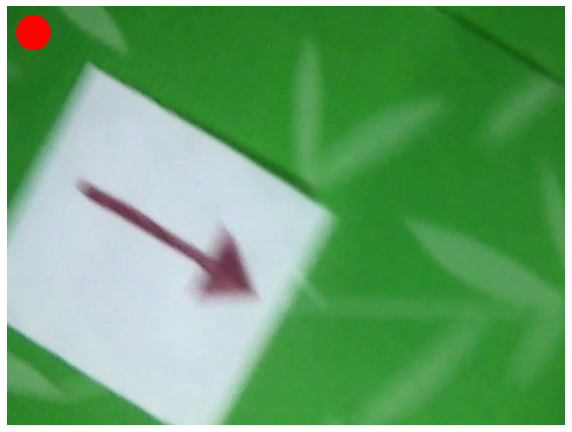

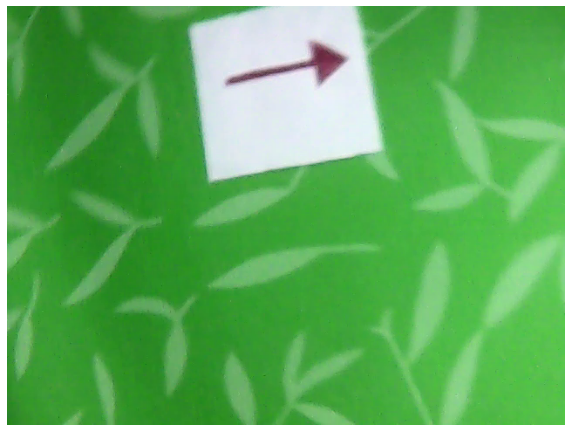

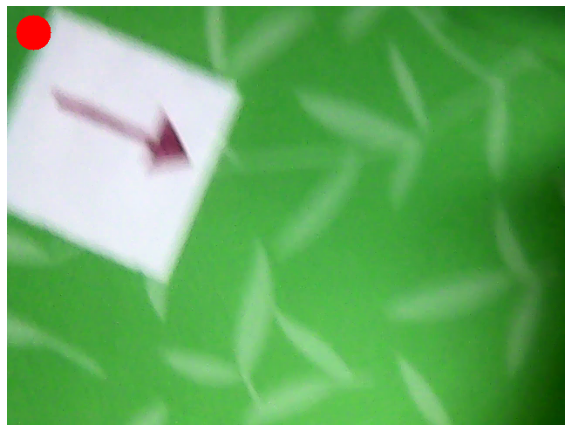

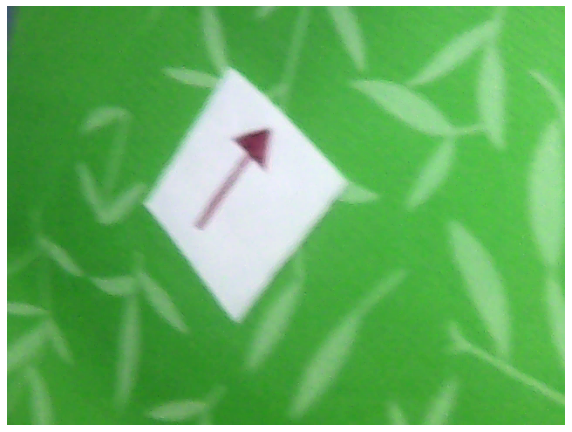

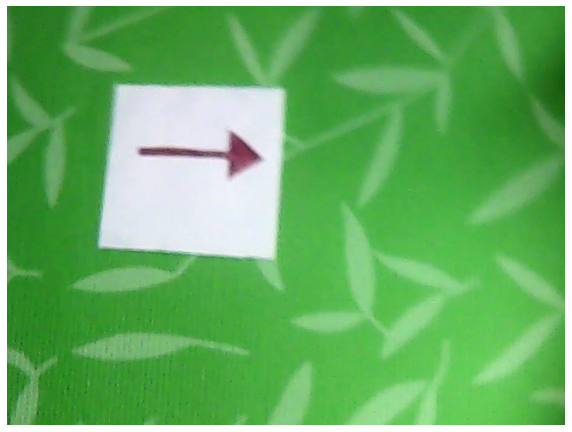

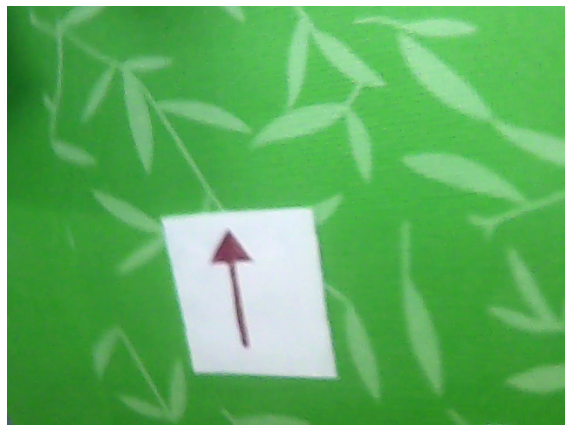

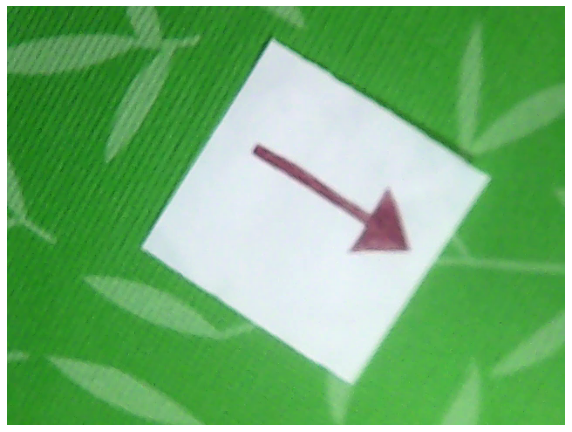

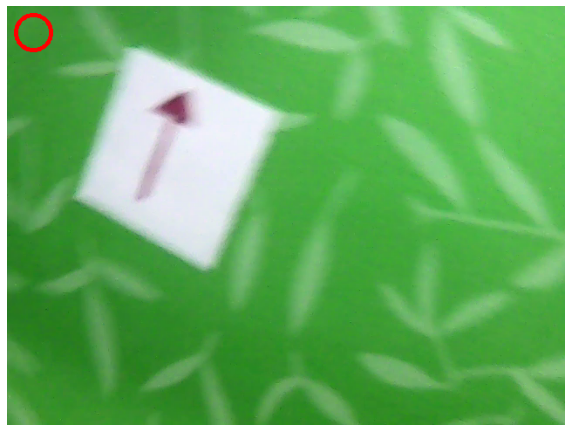

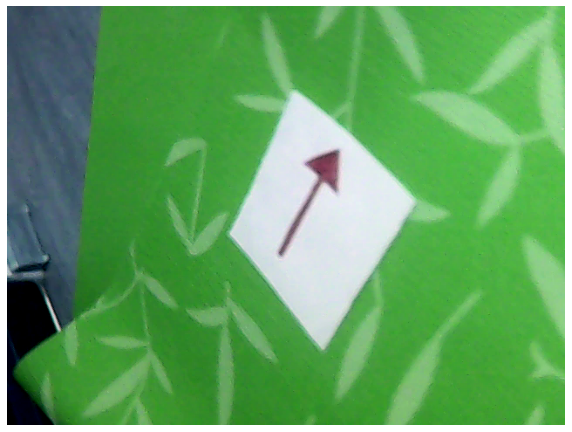

In [87]:
for image in images:

    canvas = image.copy()

    mask     = thresholding(canvas)
    contours = defaultFindContours(mask) 
    corners  = findPaperBorder(contours, 0.02)
    arrow    = findArrow(mask, contours)

    corners_cut = checkCornersCut(corners, arrow)

    # Если невозможно однозначно определить, обрезана ли бумажка, то отрисовывается полый маркер 
    if corners_cut is None:
        drawMarker(canvas, 3)
    # Если ситуация однозначная и углы обрезаны, то рисуется заполненный маркер
    elif corners_cut:
        drawMarker(canvas, -1)

    show(canvas)

# Все! Извиняюсь за задержку за сдачей.
# Выплачиваю выписанный вами штраф: <3